In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib                  # 2D Plotting Library
import plotly as plotly                # Interactive Graphing Library for Python
plt.style.use('fivethirtyeight')
import seaborn as sn
import folium
%matplotlib inline

import plotly.offline as pyo
import plotly.graph_objs as go


from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder


In [2]:
df = pd.read_csv("listings.csv")

df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355


In [3]:
df.shape

(7907, 16)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              7907 non-null   int64  
 1   name                            7905 non-null   object 
 2   host_id                         7907 non-null   int64  
 3   host_name                       7907 non-null   object 
 4   neighbourhood_group             7907 non-null   object 
 5   neighbourhood                   7907 non-null   object 
 6   latitude                        7907 non-null   float64
 7   longitude                       7907 non-null   float64
 8   room_type                       7907 non-null   object 
 9   price                           7907 non-null   int64  
 10  minimum_nights                  7907 non-null   int64  
 11  number_of_reviews               7907 non-null   int64  
 12  last_review                     51

In [5]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,7.907000e+03,7.907000e+03,7907.000000,7907.000000,7907.000000,7907.000000,7907.000000,5149.000000,7907.000000,7907.000000
mean,2.338862e+07,9.114481e+07,1.314192,103.848787,169.332996,17.510054,12.807386,1.043669,40.607689,208.726318
std,1.016416e+07,8.190910e+07,0.030577,0.043675,340.187599,42.094616,29.707746,1.285851,65.135253,146.120034
min,4.909100e+04,2.366600e+04,1.243870,103.646560,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,1.582180e+07,2.305808e+07,1.295795,103.835825,65.000000,1.000000,0.000000,0.180000,2.000000,54.000000
50%,2.470627e+07,6.344891e+07,1.311030,103.849410,124.000000,3.000000,2.000000,0.550000,9.000000,260.000000
75%,3.234850e+07,1.553811e+08,1.322110,103.872535,199.000000,10.000000,10.000000,1.370000,48.000000,355.000000
max,3.811276e+07,2.885676e+08,1.454590,103.973420,10000.000000,1000.000000,323.000000,13.000000,274.000000,365.000000


In [6]:
df.isnull().sum()

id                                   0
name                                 2
host_id                              0
host_name                            0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       2758
reviews_per_month                 2758
calculated_host_listings_count       0
availability_365                     0
dtype: int64

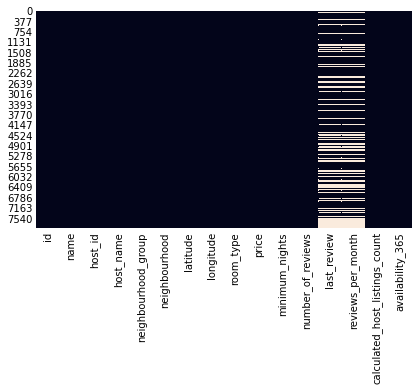

In [7]:
sn.heatmap(df.isnull(),cbar=False)

In [8]:
df1=df.drop(['last_review','reviews_per_month'],axis='columns')
df1.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,9,355


In [9]:
folium.Map(location =[18.9472,72.8347],zoom_start=15,width=800,height=800)

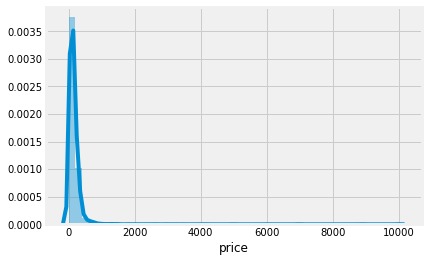

In [10]:
sn.distplot(df1['price'])

In [11]:
df1['neighbourhood_group'].unique()

array(['North Region', 'Central Region', 'East Region', 'West Region',
       'North-East Region'], dtype=object)

In [12]:
df1['room_type'].unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

In [13]:
df1['neighbourhood'].unique()

array(['Woodlands', 'Bukit Timah', 'Tampines', 'Bedok', 'Bukit Merah',
       'Newton', 'Geylang', 'River Valley', 'Jurong West', 'Rochor',
       'Queenstown', 'Serangoon', 'Marine Parade', 'Pasir Ris',
       'Toa Payoh', 'Outram', 'Punggol', 'Tanglin', 'Hougang', 'Kallang',
       'Novena', 'Downtown Core', 'Bukit Panjang', 'Singapore River',
       'Orchard', 'Ang Mo Kio', 'Bukit Batok', 'Museum', 'Sembawang',
       'Choa Chu Kang', 'Central Water Catchment', 'Sengkang', 'Clementi',
       'Jurong East', 'Bishan', 'Yishun', 'Mandai', 'Southern Islands',
       'Sungei Kadut', 'Western Water Catchment', 'Tuas', 'Marina South',
       'Lim Chu Kang'], dtype=object)

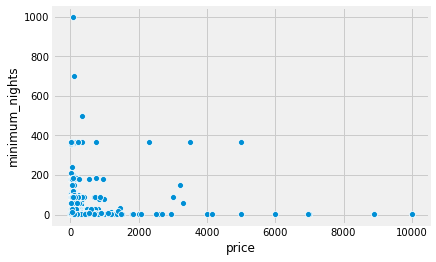

In [14]:
sn.scatterplot(x='price',y='minimum_nights',data=df1)

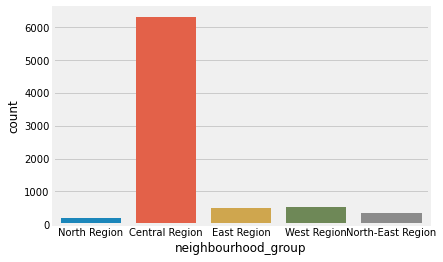

In [15]:
sn.countplot(df1['neighbourhood_group'])

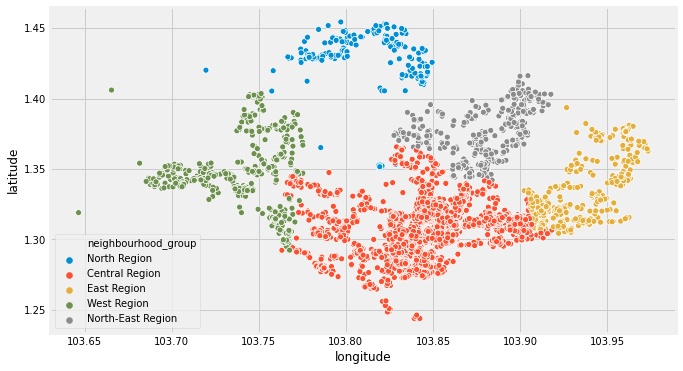

In [16]:
plt.figure(figsize=(10,6))
sn.scatterplot(df.longitude,df.latitude,hue=df.neighbourhood_group)
plt.ioff()

In [17]:
price_250 = df[df.price < 250]

In [18]:
price_250

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,38104971,2 PAX LOFT Close To Kent Ridge Park,278109833,Belle,Central Region,Queenstown,1.27973,103.78751,Entire home/apt,100,3,0,NaN,NaN,31,61
7902,38105126,Loft 2 pax near Haw Par / Pasir Panjang. Free ...,278109833,Belle,Central Region,Queenstown,1.27973,103.78751,Entire home/apt,100,3,0,NaN,NaN,31,61
7904,38109336,[ Farrer Park ] New City Fringe CBD Mins to MRT,281448565,Mindy,Central Region,Kallang,1.31286,103.85996,Private room,58,30,0,NaN,NaN,3,173
7905,38110493,Cheap Master Room in Central of Singapore,243835202,Huang,Central Region,River Valley,1.29543,103.83801,Private room,56,14,0,NaN,NaN,2,30


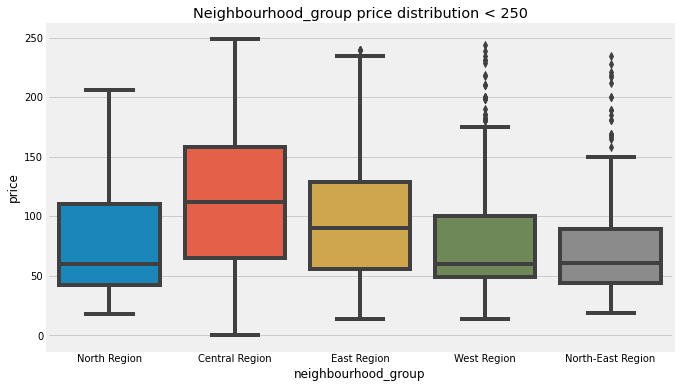

In [19]:
plt.figure(figsize=(10,6))
sn.boxplot(x="neighbourhood_group",y="price",data=price_250)
# plt.legend()
plt.title("Neighbourhood_group price distribution < 250")
plt.show()

Central Region is Most Expensive and followed by East Region is Less Expensive

In [20]:
df1.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

In [21]:
room_types = df1.groupby('room_type').size()/df1.room_type.count() * 100
labels = room_types.index
values = room_types.values

fig = go.Figure(data=[go.Pie(labels=labels,values=values,hole=.6)])
fig.show()

We can see from above pie diagram that People preferred Entire Home and least Shared room

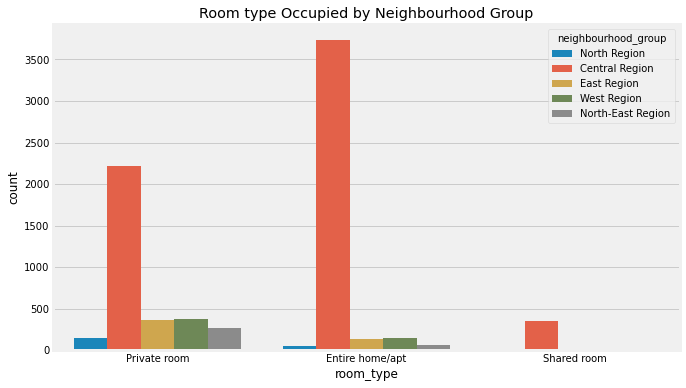

In [22]:
plt.figure(figsize=(10,6))
sn.countplot(x="room_type",hue="neighbourhood_group",data=df1)
plt.title("Room type Occupied by Neighbourhood Group")
plt.show()

<Figure size 720x432 with 0 Axes>

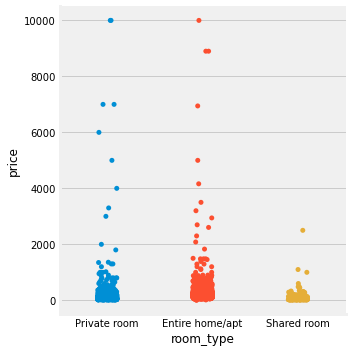

In [23]:
plt.figure(figsize=(10,6))
sn.catplot(x='room_type',y="price",data=df1)
plt.show()

We can see the most of the room price is Rs 2000

<Figure size 720x432 with 0 Axes>

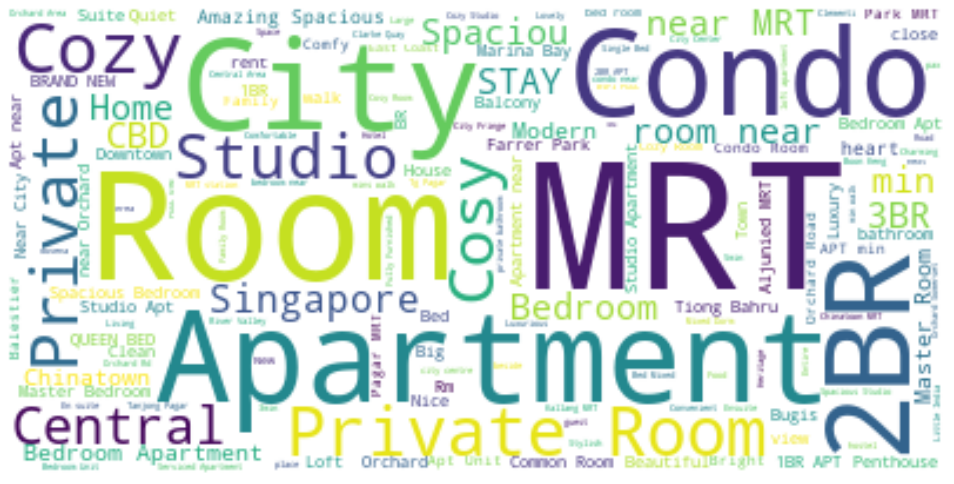

In [24]:
from wordcloud import WordCloud, ImageColorGenerator
text = " ".join(str(i) for i in df1.name)

word_cloud = WordCloud(max_words=200, background_color='white').generate(text)

plt.figure(figsize=(10,6))
plt.figure(figsize=(15,10))

plt.imshow(word_cloud,interpolation='Bilinear')
plt.axis("off")
plt.show()

In [25]:
df2 =df1.sort_values(by=['number_of_reviews'],ascending=False)
df2.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
132,2129215,Luxuriously Spacious Studio Apt.,7642747,Shirley,East Region,Bedok,1.32122,103.91492,Entire home/apt,139,2,323,1,239
140,2357514,Heritage Shophouse Right in Epicentre of Sights,1346787,Val,Central Region,Outram,1.28448,103.84360,Private room,69,1,307,3,315
470,5827998,The Lily Room,30080617,Eddie,East Region,Tampines,1.34463,103.96107,Private room,60,2,296,7,0
1237,10848771,Spacious room near Woodleigh MRT,44793532,Yuan,Central Region,Toa Payoh,1.33431,103.87554,Private room,49,1,296,2,288
722,7605283,"Clean cosy room, 7 mins to Sentosa",34333799,Felix,Central Region,Bukit Merah,1.27718,103.82167,Private room,72,3,291,1,186


In [26]:
from folium.plugins import MarkerCluster
from folium import plugins

lat = 1.32122
long = 103.91492
rev_map=folium.Map([lat,long],zoom_start=15)

rev_room_map = plugins.MarkerCluster().add_to(rev_map)


for lat,long,label in zip(df2.latitude,df2.longitude,df2.name):
    folium.Marker(location=[lat,long],icon=folium.Icon(icon='home'),popup=label).add_to(rev_room_map)
    
rev_map.add_child(rev_room_map)

rev_map

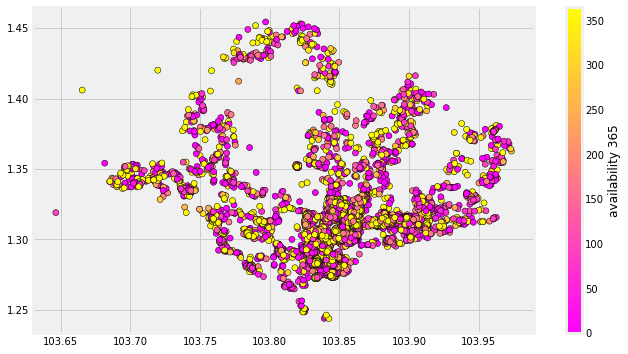

In [27]:
plt.figure(figsize=(10,6))
plt.scatter(df1.longitude,df1.latitude,c=df1.availability_365,cmap='spring',edgecolors='black',alpha=1)

cbar = plt.colorbar()
cbar.set_label("availability 365")

In [28]:
le=LabelEncoder() #One Hot Encoding

le.fit(df['neighbourhood_group'])
df1['neighbourhood_group'] = le.transform(df['neighbourhood_group'])

le.fit(df['neighbourhood'])
df1['neighbourhood'] = le.transform(df['neighbourhood'])


le.fit(df['room_type'])
df1['room_type'] = le.transform(df['room_type'])


df1.sort_values(by='price',ascending=True,inplace=True)

df1.head()


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
3168,21408571,1 BR @ Little India & Farrer Park MRT,114674497,Mitul,0,29,1.30954,103.85271,0,0,3,9,6,351
7249,35947264,Senja cozy,75175440,Rain,4,5,1.38400,103.76309,0,14,1,1,2,0
2557,18656726,Master Bedroom at The Clearwater Condo,21900076,Mary,1,1,1.33698,103.93293,2,14,1,0,2,0
2567,18679631,Small room for you,108408404,Sutthida,0,19,1.30823,103.89461,1,14,2,1,1,0
7674,37506711,Central 1BR Apt in Foodie Haven Hipster Paradise,29799617,John,0,11,1.31455,103.88323,0,14,3,4,1,34


In [29]:
df1.drop(['id','name','host_name'],axis='columns',inplace=True)
df1.head()

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
3168,114674497,0,29,1.30954,103.85271,0,0,3,9,6,351
7249,75175440,4,5,1.38400,103.76309,0,14,1,1,2,0
2557,21900076,1,1,1.33698,103.93293,2,14,1,0,2,0
2567,108408404,0,19,1.30823,103.89461,1,14,2,1,1,0
7674,29799617,0,11,1.31455,103.88323,0,14,3,4,1,34


In [30]:
model = linear_model.LinearRegression()

In [31]:
X = df1.drop('price',axis='columns')
Y = df1.price

In [32]:
x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size=0.2)

In [33]:
x_train

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
5577,23666,0,19,1.31070,103.90671,0,2,17,1,327
167,14521708,0,11,1.31566,103.88590,0,1,52,67,45
3528,109142490,4,14,1.34255,103.70873,1,3,3,3,364
138,11851304,2,41,1.44076,103.77626,1,183,5,1,365
379,25996335,0,15,1.31326,103.85289,0,1,157,9,265
...,...,...,...,...,...,...,...,...,...,...
5619,31464513,0,22,1.32704,103.84853,0,15,0,114,362
2590,17553957,0,11,1.31022,103.88486,1,1,5,1,0
193,8060780,0,24,1.28216,103.84714,1,10,17,1,365
6019,66406177,0,22,1.32240,103.85066,0,30,0,274,0


In [34]:
model.fit(x_train,y_train)

LinearRegression()

In [35]:
model.score(x_test,y_test)

0.0159085206946723

In [36]:
predicts = model.predict(x_test)

error_airbnb = pd.DataFrame({'Actual Values':np.array(y_test).flatten(),
                             'Predicted Values': predicts.flatten()})
error_airbnb.head()

,Actual Values,Predicted Values
0,40,106.752339
1,150,144.289832
2,60,105.163145
3,136,117.721425
4,69,141.734943
